# Final Proyect: Bank Marketing Segmentation

## Data Acquisition

### Importing libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
import phik

### Importing csv files

#### Dicctionary: bank_marketing_data.csv

<span style='color:orange'>**Personal information**<br></span>
**age**<br>
**age group**<br>
**eligible:** variable base in personal information<br>
**job:** type of job <br>
**salary**<br>
**marital**<br>
**education:** level of education completed <br>
**marital-education:** combination of previous columns<br>
**targeted:** variable base in personal information. Rename: **tag**<br>
<span style='color:orange'>**Financial information**<br></span>
**default:** has unpayed credit? <br>
**balance:** remaining balance in the account <br>
**housing:** has housing loan? <br>
**loan:** has previous loan?<br>
<span style='color:orange'>**Last contact information**<br></span>
**contact:** communication type <br>
**day:** day of the month <br>
**month** <br>
**duration:** in seconds, if equal to 0 target will be 'False' <br>
**campaign:** number of contacts preformed in this campaign for this client <br>
<span style='color:orange'>**Previous campaing info**<br></span>
**pdays:** number of days pass since last contact in previous campaing, 999 equals 'no contact'. Rename: **pcampign**<br>
**previous:**  number of contacts preformed in previous campaing for this client <br>
**poutcome:** outcome of the previous marketing campaign<br>
<span style='color:orange'>**Target**<br></span>
**y:** has the client subscribed?, equal to 'response'<br>
**response** rename **outcome**

In [3]:
bank_df = pd.read_csv("bank_marketing_data.csv")
bank_df.head()

,age,age group,eligible,job,salary,marital,education,marital-education,targeted,default,...,contact,day,month,duration,campaign,pdays,previous,poutcome,y,response
0,58,5,Y,management,100000,married,tertiary,married-tertiary,yes,no,...,unknown,5,may,261,1,-1,0,unknown,no,0
1,44,4,Y,technician,60000,single,secondary,single-secondary,yes,no,...,unknown,5,may,151,1,-1,0,unknown,no,0
2,33,3,Y,entrepreneur,120000,married,secondary,married-secondary,yes,no,...,unknown,5,may,76,1,-1,0,unknown,no,0
3,47,4,Y,blue-collar,20000,married,unknown,married-unknown,no,no,...,unknown,5,may,92,1,-1,0,unknown,no,0
4,33,3,Y,unknown,0,single,unknown,single-unknown,no,no,...,unknown,5,may,198,1,-1,0,unknown,no,0


In [4]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   age                45211 non-null  int64 
 1   age group          45211 non-null  int64 
 2   eligible           45211 non-null  object
 3   job                45211 non-null  object
 4   salary             45211 non-null  int64 
 5   marital            45211 non-null  object
 6   education          45211 non-null  object
 7   marital-education  45211 non-null  object
 8   targeted           45211 non-null  object
 9   default            45211 non-null  object
 10  balance            45211 non-null  int64 
 11  housing            45211 non-null  object
 12  loan               45211 non-null  object
 13  contact            45211 non-null  object
 14  day                45211 non-null  int64 
 15  month              45211 non-null  object
 16  duration           45211 non-null  int64

Observations:
- The variables are numeric integer & categorical.
- There's columns with binary values.
- None null values

### Renaming columns

In [5]:
bank_df.rename(columns={'age group':'age_group','targeted':'tag','previous':'pcampaign','response':'outcome'},inplace=True)
bank_df.head()

,age,age_group,eligible,job,salary,marital,education,marital-education,tag,default,...,contact,day,month,duration,campaign,pdays,pcampaign,poutcome,y,outcome
0,58,5,Y,management,100000,married,tertiary,married-tertiary,yes,no,...,unknown,5,may,261,1,-1,0,unknown,no,0
1,44,4,Y,technician,60000,single,secondary,single-secondary,yes,no,...,unknown,5,may,151,1,-1,0,unknown,no,0
2,33,3,Y,entrepreneur,120000,married,secondary,married-secondary,yes,no,...,unknown,5,may,76,1,-1,0,unknown,no,0
3,47,4,Y,blue-collar,20000,married,unknown,married-unknown,no,no,...,unknown,5,may,92,1,-1,0,unknown,no,0
4,33,3,Y,unknown,0,single,unknown,single-unknown,no,no,...,unknown,5,may,198,1,-1,0,unknown,no,0


## One variable analysis

In [6]:
%matplotlib inline

### Binary variables analysis

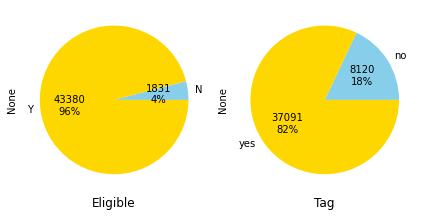

In [7]:
def label_function(val):
    return f'{val / 100 * len(bank_df):.0f}\n{val:.0f}%'

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(6, 4))

bank_df.groupby('eligible').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 10},
                                  colors=['skyblue', 'gold'], ax=ax1)
bank_df.groupby('tag').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 10},
                                 colors=['skyblue', 'gold'], ax=ax2)
                                
ax1.set_xlabel('Eligible', size=12)
ax2.set_xlabel('Tag', size=12)

plt.tight_layout()
plt.show()

Observations:
- Highly unbalance variables.

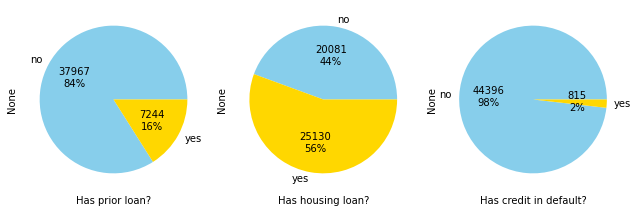

In [8]:
def label_function(val):
    return f'{val / 100 * len(bank_df):.0f}\n{val:.0f}%'

fig, (ax1, ax2,ax3) = plt.subplots(ncols=3, figsize=(9, 4))

bank_df.groupby('loan').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 10},
                                  colors=['skyblue', 'gold'], ax=ax1)
bank_df.groupby('housing').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 10},
                                 colors=['skyblue', 'gold'], ax=ax2)
bank_df.groupby('default').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 10},
                                 colors=['skyblue', 'gold'], ax=ax3)                                
ax1.set_xlabel('Has prior loan?', size=10)
ax2.set_xlabel('Has housing loan?', size=10)
ax3.set_xlabel('Has credit in default?', size=10)
plt.tight_layout()
plt.show()

Observations:
- The amount of clients with housing loan is divided almost by half.
- Most clients didn't acquired previous loans and even less are in default with their credits.


### Personal information variables

Age

In [9]:
bank_df['age'].describe()

count    45211.000000
mean        40.936210
std         10.618762
min         18.000000
25%         33.000000
50%         39.000000
75%         48.000000
max         95.000000
Name: age, dtype: float64

In [10]:
px.box(bank_df, y= 'age', title = 'Age',).show()


Job

In [11]:
px.histogram(bank_df, x= bank_df['job'], labels={'x':'Job area'}, title = 'Job area count').show()

Salary

In [12]:
bank_df['salary'].describe()

count     45211.000000
mean      57006.171065
std       32085.718415
min           0.000000
25%       20000.000000
50%       60000.000000
75%       70000.000000
max      120000.000000
Name: salary, dtype: float64

In [13]:
px.box(bank_df, y= 'salary', title = 'Salary').show()

Education

In [14]:
education_count = bank_df['education'].value_counts().reset_index()
education_count.rename(columns={'index':'education','education':'num_clients'}, inplace=True)
px.pie(education_count, values='num_clients' , names='education', title = 'Level of education',hole=.4).show()

Observation:<br>
- Most of the clients fall into the **age range between 30 and 50**. There is outliers over 70.<br>
- 5 of the 12 job areas encompasses most of the clients.<br>
- There's **no outliers** in **salary**. This variable has a fairly even distribution.
- Most of the clients have reached a secondary or terciary level of education.

### Contact variables

Contact type

In [15]:
contact_count = bank_df['contact'].value_counts().reset_index()
px.pie(contact_count, values='contact' , names='index', title = 'Type of contact',hole=.4).show()

Date

In [16]:
px.histogram(bank_df, x= bank_df['month'], labels={'x':'Month'}, title = 'Number of contacts per month').show()

Duration

In [17]:
px.violin(bank_df, y='duration')

Number of contacts in campaign

In [18]:
px.box(bank_df, y='campaign',title='Number of contacts during Campaign')

Observations:<br>
- Most contacts were made by cellphone, there's missing information reflected as 'unknown'.<br>
- Most contacts were made between may and august.<br>
- There is many **outliers** in the variables **duration & campaign**. Most are conentrated under 1500 seconds in duration and under 6 contacts in campaign.

### Target analysis

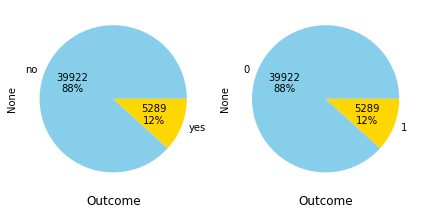

In [19]:
def label_function(val):
    return f'{val / 100 * len(bank_df):.0f}\n{val:.0f}%'

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(6, 4))

bank_df.groupby('y').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 10},
                                  colors=['skyblue', 'gold'], ax=ax1)
bank_df.groupby('outcome').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 10},
                                 colors=['skyblue', 'gold'], ax=ax2)
                                
ax1.set_xlabel('Outcome', size=12)
ax2.set_xlabel('Outcome', size=12)

plt.tight_layout()
plt.show()

Observations:<br>
- It's highly likely that both variables are the same, this can be confirm with correlation.

## Two variables analysis

### Correlations

Text(0.5, 1.0, 'Variables correlation')

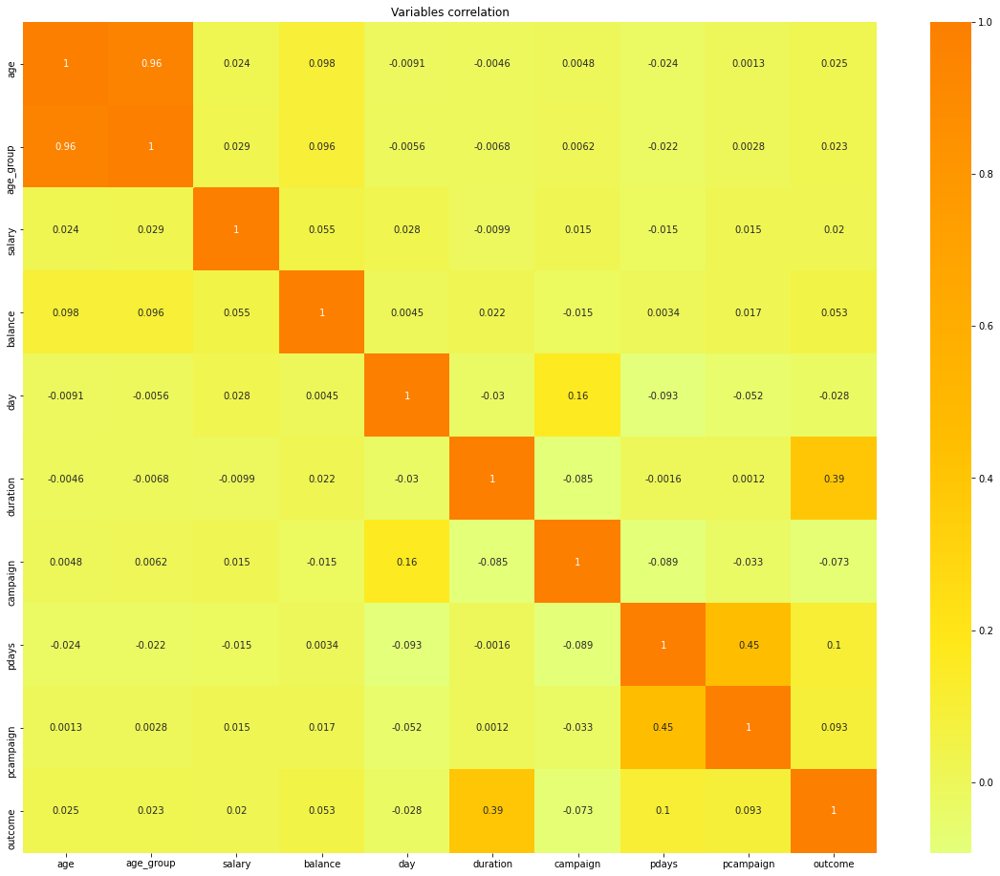

In [20]:
plt.rcParams['figure.figsize'] = (20, 16)
#Correlation for numeric variables 
sns.heatmap(bank_df.corr(), annot = True, cmap = 'Wistia')
plt.title('Variables correlation')

Observations:<br>
- High linear correlation between **duration & outcome**, target variable.<br>
- Some linear correlation between **days since last marketing campaign contact (pdays) & response**.<br>
- High linear correlation between **pdays & amount of times contacted the client in previous campaign (pcampaign)**.<br>
- Some linear correlation between **day of contact (day) & number of contacts to the client (campaign) **.<br>


interval columns not set, guessing: ['age', 'age_group', 'salary', 'balance', 'day', 'duration', 'campaign', 'pdays', 'pcampaign', 'outcome']


Text(0.5, 1.0, 'Variables correlation with phik')

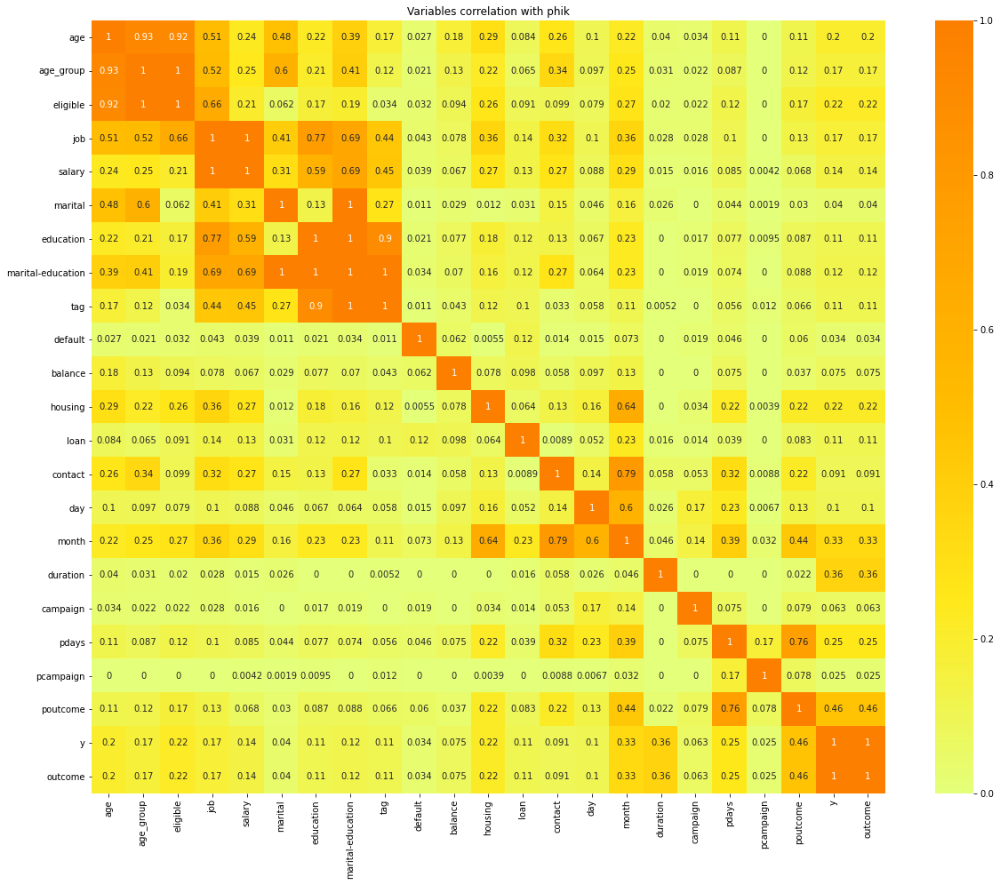

In [21]:
plt.rcParams['figure.figsize'] = (20, 16)
#It is use 'phik' correlation to be able to obtain correlation between categorical variables 
sns.heatmap(bank_df.phik_matrix(), annot = True, cmap = 'Wistia')
plt.title('Variables correlation with phik')

Observation:<br>
- The variables 'y' & 'outcome' have a correlation of **1** and the same correlation with other variables, confirming that they're the same varible, different expression.<br>
- The variable **outcome** is correlatead with the following variables, order from highest to lower:
    - **poutcome:** outcome in previous campaign.
    - **duration:** call duration in seconds.
    - **month**
    - **pdays**
    - **housing loan & eligible**
    - **age**
    - **job**
- The following variables have a high correlation between each other:
    - age, age group & eligible
    - job with the previous variables
    - **job & salary** with a correlation of **1**
    - **job, education & marital_education**
    - **education, marital_education & tag** **1 & 0.9**
    - **month & day**

### Duration vs Outcome

C:\Users\Nico\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



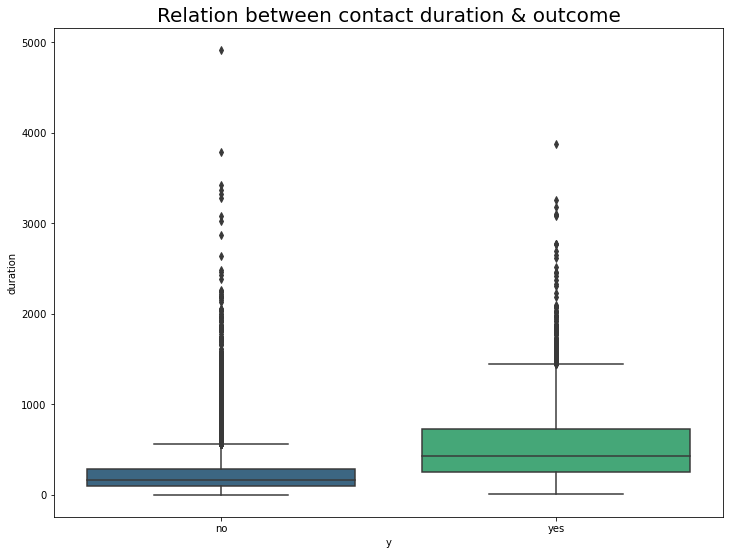

In [22]:
plt.rcParams['figure.figsize'] = (12, 9)

sns.boxplot(bank_df['y'], bank_df['duration'], palette = 'viridis')
plt.title('Relation between contact duration & outcome', fontsize = 20)
plt.show()

In [23]:
fig = px.box(bank_df, x="y", y="duration",title='Relation between contact duration & outcome')
fig.show()

Observations:<br>
- When **outcome** is **yes**, **duration** has a **higher median**.<br>
- Duration over 279 are more likely to be a **yes** response. 

### poutcome vs pdays

In [24]:
fig = px.box(bank_df, x="poutcome", y="pdays",title='Relation between days since last campign contact & previous outcome')
fig.show()

Observations:<br>
- If the number of days (pdays) is under 200, the previous outcome (poutcome) was likely successful. And, since this has a positive correlation with the current outcome, this is likely to be **yes**.

### Marital-education & tag

In [25]:
fig = px.histogram(bank_df, x="marital-education", color="tag", title="Relation between education & tag variable")
fig.show()

In [26]:
bank_df.groupby(['tag','y']).size().reset_index()

,tag,y,0
0,no,no,6785
1,no,yes,1335
2,yes,no,33137
3,yes,yes,3954


Observations:<br>
- The variable **tag** is defined base on the variable **marital-education** which in turn is a combination of those variables.<br>
- The variable **tag** does not have a visible correlation with **outcome**.

### Age group & eligible

In [27]:
fig = px.histogram(bank_df, x="age_group", color="eligible", title="Relation between age group & eligible variable")
fig.show()

Observations:<br>
- The variable **eligible** is defined base on the variable **age_group** which in turn is base on age.<br>

In [28]:
fig = px.histogram(bank_df, x="month", color="y", title="Relation between month & outcome")
fig.show()

Observations:<br>
There's no visible correlation between the variables.

## Multivariate analysis

In [29]:
#sns.pairplot(bank_df, hue='y')

In [30]:
bank_df.groupby(['job','marital','y']).size().reset_index()

,job,marital,y,0
0,admin.,divorced,no,660
1,admin.,divorced,yes,90
2,admin.,married,no,2387
3,admin.,married,yes,306
4,admin.,single,no,1493
...,...,...,...,...
67,unknown,divorced,yes,1
68,unknown,married,no,182
69,unknown,married,yes,21
70,unknown,single,no,56


In [31]:
fig = px.parallel_categories(bank_df, color="outcome", dimensions= ['eligible', 'housing', 'loan','y'],color_continuous_scale=px.colors.sequential.Inferno)
fig.show()

In [32]:
loan_tab = pd.crosstab(index=bank_df['loan'],columns=bank_df['y'])
print(loan_tab)

y        no   yes
loan             
no    33162  4805
yes    6760   484


In [33]:
from scipy.stats import chi2_contingency

In [34]:
chi2_contingency(loan_tab)[1]

1.665061163492756e-47

In [36]:
bank_df.head()

,age,age_group,eligible,job,salary,marital,education,marital-education,tag,default,...,contact,day,month,duration,campaign,pdays,pcampaign,poutcome,y,outcome
0,58,5,Y,management,100000,married,tertiary,married-tertiary,yes,no,...,unknown,5,may,261,1,-1,0,unknown,no,0
1,44,4,Y,technician,60000,single,secondary,single-secondary,yes,no,...,unknown,5,may,151,1,-1,0,unknown,no,0
2,33,3,Y,entrepreneur,120000,married,secondary,married-secondary,yes,no,...,unknown,5,may,76,1,-1,0,unknown,no,0
3,47,4,Y,blue-collar,20000,married,unknown,married-unknown,no,no,...,unknown,5,may,92,1,-1,0,unknown,no,0
4,33,3,Y,unknown,0,single,unknown,single-unknown,no,no,...,unknown,5,may,198,1,-1,0,unknown,no,0


In [ ]:
sns.scatterplot(data=bank_df, x='salary', y='tip',hue='sex',palette='plasma',style='smoker');

<AxesSubplot:xlabel='job', ylabel='salary'>

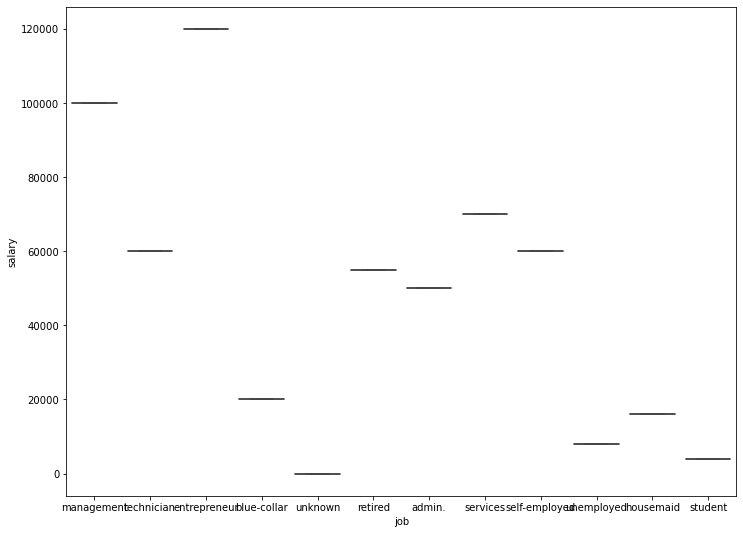

In [39]:
sns.boxplot(x=bank_df['job'],y=bank_df['salary'])

In [41]:
df_1 = bank_df[['job','salary']]
df_1

,job,salary
0,management,100000
1,technician,60000
2,entrepreneur,120000
3,blue-collar,20000
4,unknown,0
...,...,...
45206,technician,60000
45207,retired,55000
45208,retired,55000
45209,blue-collar,20000


In [46]:
bank_df.groupby('job')['salary'].value_counts()

job            salary
admin.         50000     5171
blue-collar    20000     9732
entrepreneur   120000    1487
housemaid      16000     1240
management     100000    9458
retired        55000     2264
self-employed  60000     1579
services       70000     4154
student        4000       938
technician     60000     7597
unemployed     8000      1303
unknown        0          288
Name: salary, dtype: int64

In [48]:
bank_df.loc[bank_df['job'] == 'blue-collar']

,age,age_group,eligible,job,salary,marital,education,marital-education,tag,default,...,contact,day,month,duration,campaign,pdays,pcampaign,poutcome,y,outcome
3,47,4,Y,blue-collar,20000,married,unknown,married-unknown,no,no,...,unknown,5,may,92,1,-1,0,unknown,no,0
17,57,5,Y,blue-collar,20000,married,primary,married-primary,yes,no,...,unknown,5,may,38,1,-1,0,unknown,no,0
20,28,2,Y,blue-collar,20000,married,secondary,married-secondary,yes,no,...,unknown,5,may,262,1,-1,0,unknown,no,0
22,32,3,Y,blue-collar,20000,single,primary,single-primary,yes,no,...,unknown,5,may,160,1,-1,0,unknown,no,0
33,59,5,Y,blue-collar,20000,married,secondary,married-secondary,yes,no,...,unknown,5,may,226,1,-1,0,unknown,no,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45178,34,3,Y,blue-collar,20000,married,secondary,married-secondary,yes,no,...,cellular,12,nov,413,1,92,3,success,yes,1
45181,46,4,Y,blue-collar,20000,married,secondary,married-secondary,yes,no,...,cellular,15,nov,74,2,118,3,failure,no,0
45190,32,3,Y,blue-collar,20000,married,secondary,married-secondary,yes,no,...,cellular,16,nov,206,1,188,3,success,yes,1
45199,34,3,Y,blue-collar,20000,single,secondary,single-secondary,yes,no,...,cellular,16,nov,1166,3,530,12,other,no,0
